## P4 Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## 1. Compute the camera calibration using chessboard images

In [2]:
import numpy as np
import cv2
import glob
import matplotlib
matplotlib.use('Qt5agg')
import matplotlib.pyplot as plt
from pathlib import Path

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

distortion_correction_file = Path("./distortion_correction_pickle.p")
if distortion_correction_file.is_file():
    print('Distortion correction file already created')
else:
    # Make a list of calibration images
    images = glob.glob('./camera_cal/calibration*.jpg')
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            cv2.imshow('img',img)
            cv2.waitKey(500)

    cv2.destroyAllWindows()

Distortion correction file already created


## 2. Apply distortion correction to test images and save the camera calibration result for later use
Use object points and image points to calculate distortion coefficients, and test undistortion on an image.

image size is (1280, 720)


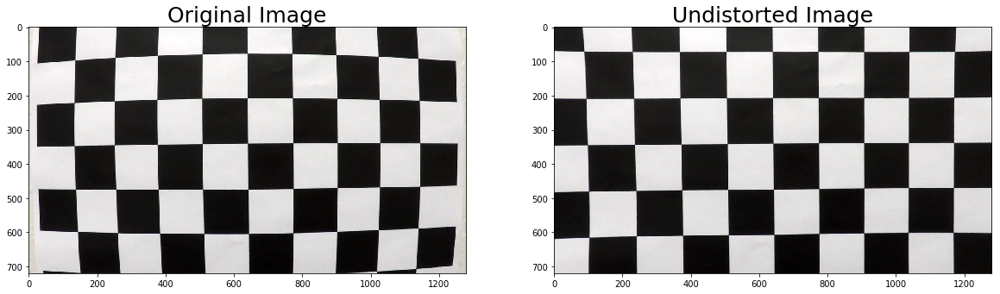

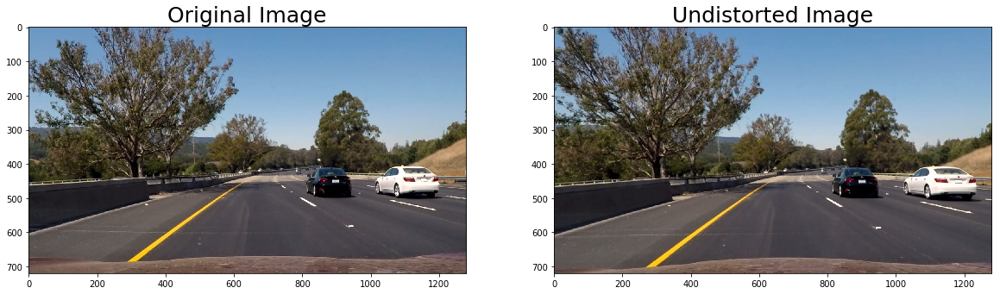

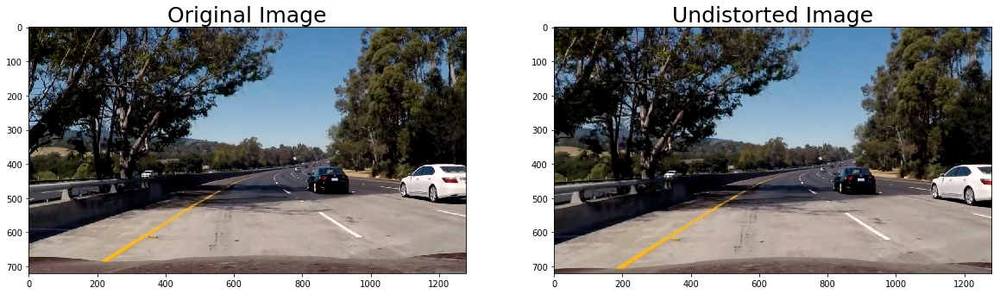

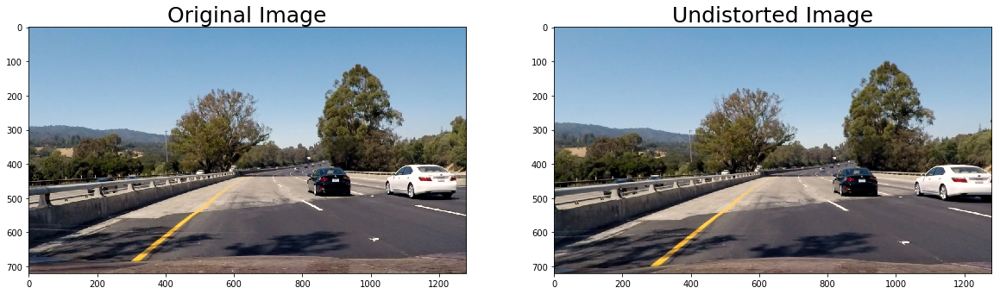

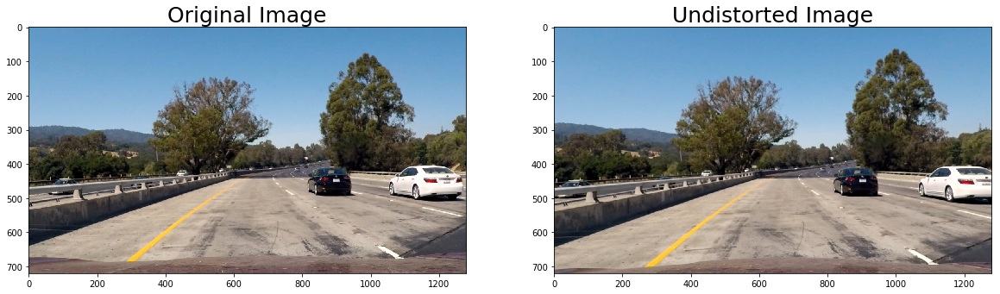

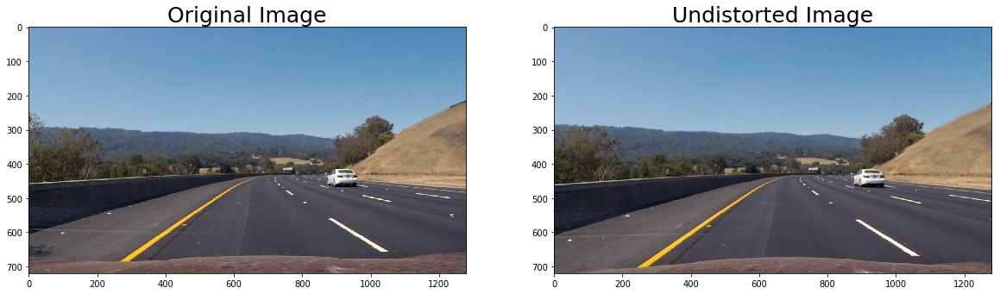

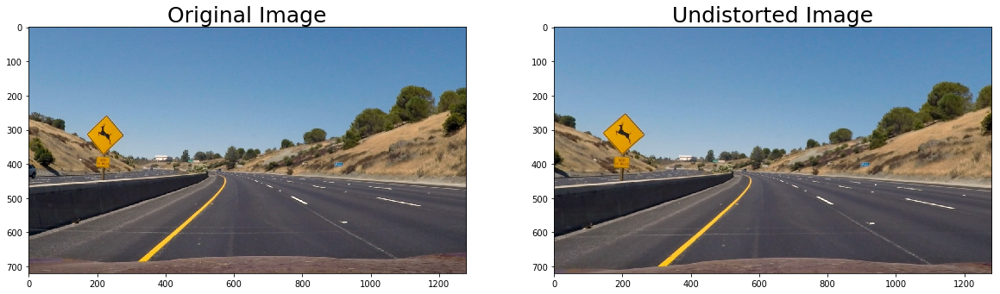

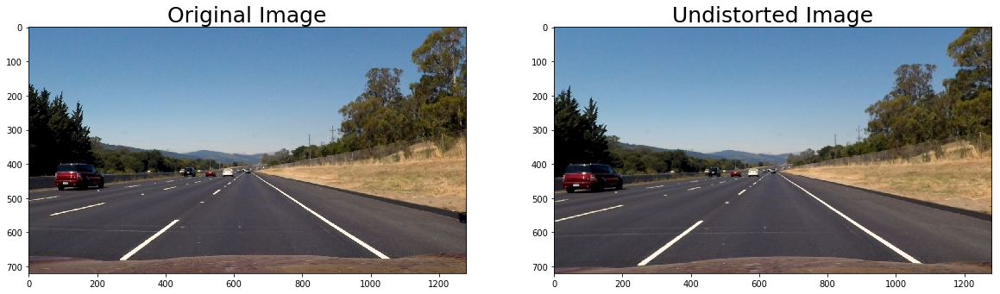

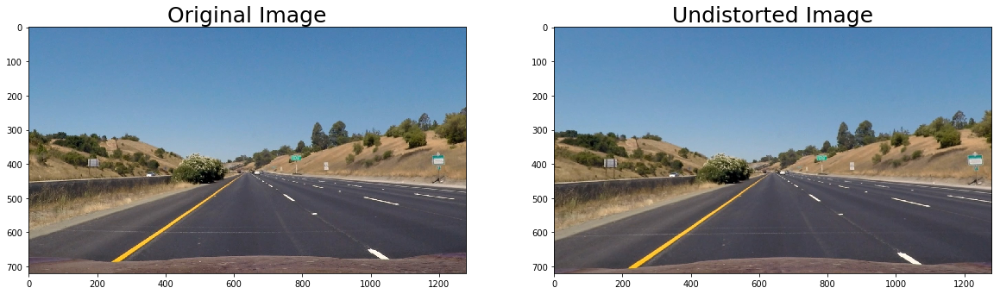

In [3]:
import pickle
%matplotlib inline

# Make a list of test images set 1
test_images_1 = glob.glob('./test_images/test*.jpg')
# Make a list of test images set 2
test_images_2 = glob.glob('./test_images/straight_lines*.jpg')
# Combine the test images set 1 and 2
test_images = test_images_1 + test_images_2

# Test undistortion on an image
test_img_path = './test_images/straight_lines1.jpg'
img = cv2.imread(test_img_path)
img_size = (img.shape[1], img.shape[0])
print('image size is {}'.format(img_size))

# check if we already created the calibration file with coefficients
if distortion_correction_file.is_file():
    # load the coefficients to undistort the camera image
    with open('./distortion_correction_pickle.p', mode='rb') as f:
        calibration_file = pickle.load(f)
        mtx, dist = calibration_file['mtx'], calibration_file['dist']
else:
    print('Calibration does not exist. Please run the cell above to create it first.')
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( './distortion_correction_pickle.p', 'wb' ) )

# apply distortion correction to the camera calibration image
filename = './camera_cal/calibration1.jpg'
img = cv2.imread(filename)
dst = cv2.undistort(img, mtx, dist, None, mtx)
# Process the file name for saving to a different directory
filename = filename.replace('./camera_cal/', '')
undistorted_filename = './output_images/' + 'undist_' + filename
cv2.imwrite(undistorted_filename, dst)
# Convert to RGB color space
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=25)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=25)    

# apply distortion correction to the test images
for filename in test_images:
    img = cv2.imread(filename)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    # Process the file name for saving to a different directory
    filename = filename.replace('./test_images/', '')
    undistorted_filename = './output_images/' + 'undist_' + filename
    cv2.imwrite(undistorted_filename, dst)
    # Convert to RGB color space
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=25)


## 3. Helper methods that output a binary image using different gradients with thresholds

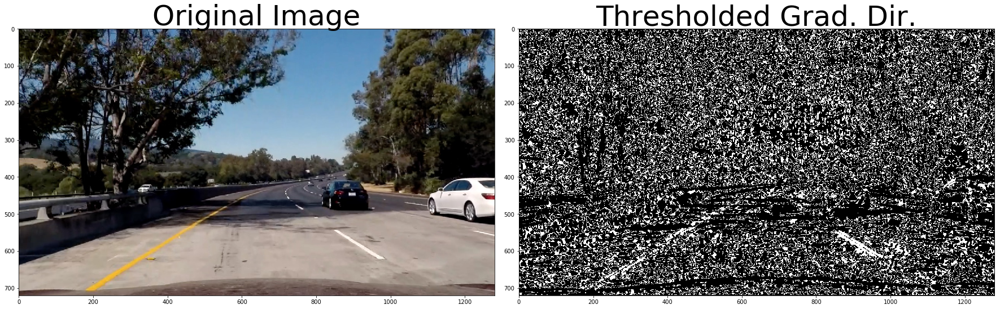

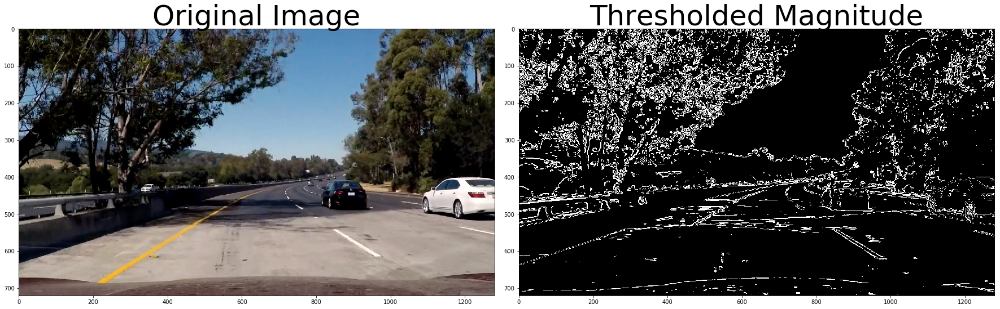

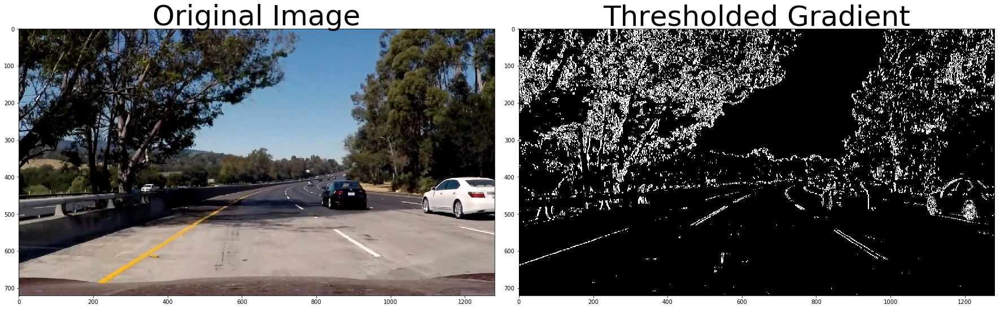

In [8]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Read in a test image
test_img = './test_images/test5.jpg'
# test_img = './test_images/straight_lines1.jpg'
# test_img = './test_images/challenge.jpg'
# test_img = './test_images/cement2.jpg'
# test_img = './test_images/FirstFrame.jpg'

image = mpimg.imread(test_img)
undistort_img = cv2.undistort(image, mtx, dist, None, mtx)
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=15, thresh=(35, 70)):
    """
    Output a binary image by
    taking an input image, applying a Sobel directional gradient with 
    kernel size (default 15) 
    and threshold (default 35 degrees to 70 degrees)
    
    """
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx= cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely= cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir_sobel = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    sobel_binary = np.zeros_like(dir_sobel)
    # convert degrees to radians
    thresh = (thresh[0] /90 * (np.pi/2), thresh[1] /90 * (np.pi/2))

    sobel_binary[(dir_sobel >= thresh[0]) & (dir_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sobel_binary
    
# Run the function
dir_binary = dir_threshold(undistort_img, sobel_kernel=15, thresh=(45, 70))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistort_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx= cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely= cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude
    mag_sobelxy = (sobelx**2 + sobely**2)**0.5     
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag_sobelxy/np.max(mag_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image

    return mag_binary
    
# Run the function
mag_binary = mag_thresh(undistort_img, sobel_kernel=3, mag_thresh=(30, 70))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh=(20, 100), sobel_kernel=3):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image

    return grad_binary
    
# Run the function
grad_binary = abs_sobel_thresh(undistort_img, orient='x', thresh=(20, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 4. Use color transforms, gradients, etc., to create a thresholded binary image

/Users/michaelchen/anaconda3/envs/py36/lib/python3.6/site-packages/skimage/util/dtype.py:141: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))
/Users/michaelchen/anaconda3/envs/py36/lib/python3.6/site-packages/skimage/util/dtype.py:141: UserWarning: Possible precision loss when converting from uint16 to uint8
  .format(dtypeobj_in, dtypeobj_out))


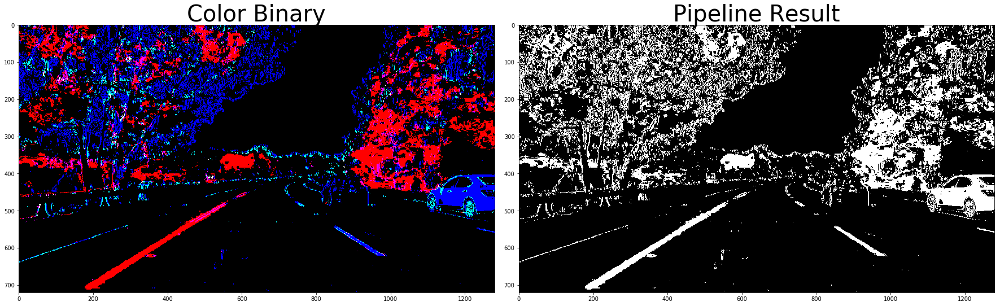

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage import img_as_uint
from skimage import io

image = mpimg.imread(test_img) # use the test image from previous cell
# image = mpimg.imread(test_img_path)
undistort_img = cv2.undistort(image, mtx, dist, None, mtx)

def pipeline(img, h_thresh = (14, 24), s_thresh=(75, 255), 
             white_h_thresh = (0, 179), white_s_thresh=(1, 25), white_v_thresh = (200, 255), 
             sx_thresh=(20, 100), sy_thresh=(20, 100),
             dir_thresh = (25,75), 
             sobel_kernel=3):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    h_channel = hsv[:,:,0]
    s_channel = hsv[:,:,1]
    v_channel = hsv[:,:,2]

    # Threshold x gradient
    sxbinary = abs_sobel_thresh(img, orient='x', thresh=(20, 100))
            
    # Threshold the hue channel
    # yellow hue
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1
    # white hue (basically anything)
    white_h_binary = np.zeros_like(h_channel)
    white_h_binary[(h_channel >= white_h_thresh[0]) & (h_channel <= white_h_thresh[1])] = 1 
    
    # Threshold saturation channel
    # yellow saturation
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # white saturation (very low)
    white_s_binary = np.zeros_like(s_channel)
    white_s_binary[(s_channel >= white_s_thresh[0]) & (s_channel <= white_s_thresh[1])] = 1
    
    # Threshold v channel
    white_v_binary = np.zeros_like(v_channel)
    white_v_binary[(v_channel >= white_v_thresh[0]) & (v_channel <= white_v_thresh[1])] = 1    
    
    combined_output = np.zeros_like(s_channel)
    binary_output1 = np.zeros_like(s_channel)
    binary_output2 = np.zeros_like(s_channel)
    binary_output3 = np.zeros_like(s_channel)
    
    binary_output1[((sxbinary ==1) | (s_binary == 1)) & (h_binary==1)] = 1 # yellow line
    binary_output2[(sxbinary == 1) & ((white_s_binary == 1) & (white_h_binary==1))] = 1 #  white line 1
    binary_output3[(sxbinary == 1) | ((white_v_binary == 1) & (white_s_binary == 1) & (white_h_binary==1))] = 1 # white line 2
    
    combined_output[(binary_output1 == 1) | (binary_output2 == 1) | (binary_output3 == 1)] = 1

    # Stack each channel to visualize the effect of each output
    color_binary = np.dstack((binary_output1, binary_output2, binary_output3))
    #return b+w binary and color_binary
    return combined_output, color_binary

# test the binary image pipeline
result, result_color = pipeline(undistort_img)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(result_color)
ax1.set_title('Color Binary', fontsize=40)

ax2.imshow(result, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# save the binary result to disk
io.imsave('./output_images/binary_result.jpg', img_as_uint(result))

## 5. Apply the perspective transform to convert the binary image to a birds-eye view.

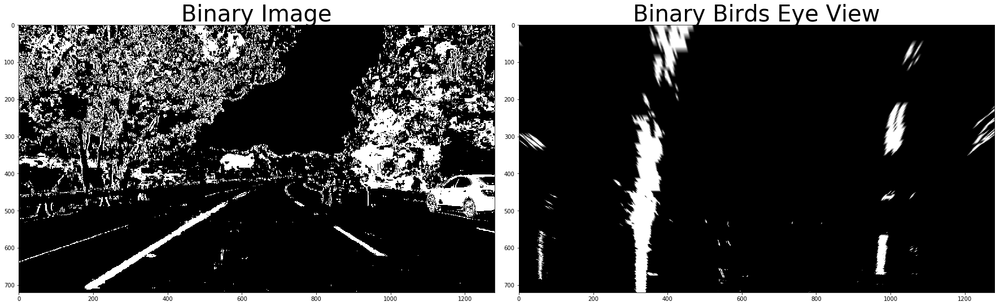

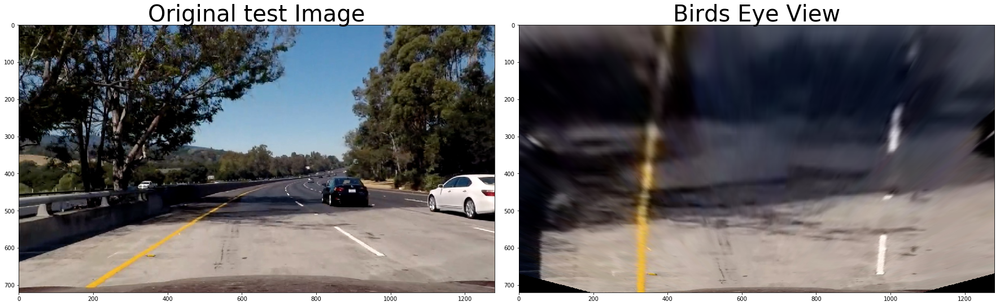

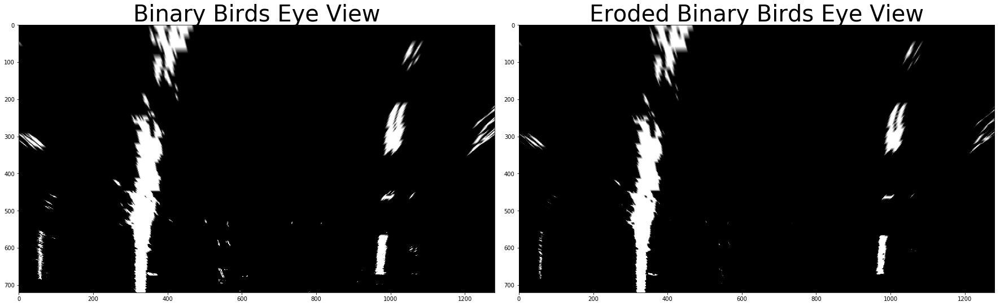

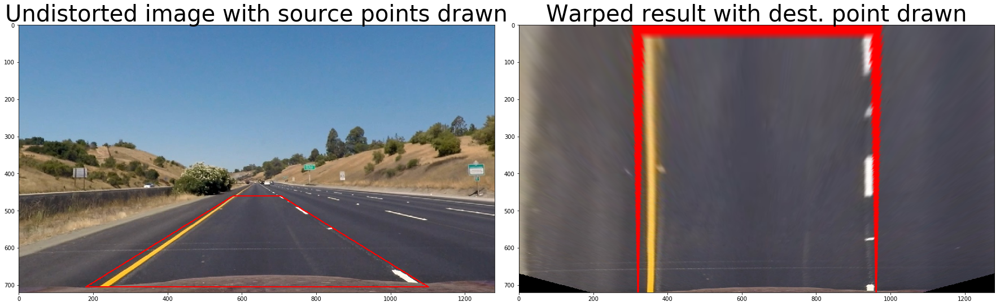

In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage import img_as_uint
from skimage import io

image = mpimg.imread(test_img) # use the test image from previous cell
# image = mpimg.imread(test_img_path)
undistort_img = cv2.undistort(image, mtx, dist, None, mtx)
# global parameters
corners = [(576,460), (705,460), (1102, 705),(180, 705)]
src = np.float32([corners[0], corners[1], corners[2], corners[3]])
dst = np.float32([[320,0],[960, 0],[960, 720],[320, 720]])
result, result_color = pipeline(undistort_img)

def perspective_unwarp(img):
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])

    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)

    # Return the resulting image and matrix
    return warped

def erode_image(img, k_size=(3,3)):
    kernel = np.ones(k_size,np.uint8)
    erosion = cv2.erode(img,kernel,iterations = 1)
    return erosion

def draw_polyline(img, pts):
    # Draw a polygon
    pts = pts.reshape((-1,1,2))
    pts = np.int32(pts) # convert float to int to avoid errors
    cv2.polylines(img,[pts],True,(255,0,0), 2)
    return img


# test
birds_eye = perspective_unwarp(result)
eroded_birds_eye = erode_image(birds_eye)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(result, cmap='gray')
ax1.set_title('Binary Image', fontsize=40)

ax2.imshow(birds_eye, cmap='gray')
ax2.set_title('Binary Birds Eye View', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# save the result to disk
io.imsave('./output_images/birds_eye.jpg', img_as_uint(birds_eye))

# plot the image with warp
f, (ax3, ax4) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax3.imshow(undistort_img)
ax3.set_title('Original test Image', fontsize=40)

warped_image = perspective_unwarp(undistort_img)
warped_cv2_image = cv2.cvtColor(warped_image, cv2.COLOR_RGB2BGR)
cv2.imwrite('./warped_image.jpg', warped_cv2_image)
ax4.imshow(warped_image)
ax4.set_title('Birds Eye View', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# save the result to disk
io.imsave('./output_images/warped_image.jpg', img_as_uint(warped_image))

# plot the binary image with erosion
f, (ax5, ax6) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax5.imshow(birds_eye, cmap='gray')
ax5.set_title('Binary Birds Eye View', fontsize=40)

ax6.imshow(eroded_birds_eye, cmap='gray')
ax6.set_title('Eroded Binary Birds Eye View', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# plot polyline to verify lines are parallel
f, (ax7, ax8) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

image = mpimg.imread('./test_images/straight_lines1.jpg') # use the test image with straight lines
undistorted_straight_line_img = cv2.undistort(image, mtx, dist, None, mtx)
polyline_img = draw_polyline(undistorted_straight_line_img, src)
ax7.imshow(polyline_img)
ax7.set_title('Undistorted image with source points drawn', fontsize=40)
io.imsave('./output_images/undistorted_img_w_source_pts.jpg', img_as_uint(undistorted_straight_line_img))

warped_polyline_img = perspective_unwarp(polyline_img)
ax8.imshow(warped_polyline_img)
ax8.set_title('Warped result with dest. point drawn', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
io.imsave('./output_images/warped_result_w_dest_pts.jpg', img_as_uint(warped_polyline_img))

## 6. Define a method to measure the radii of the left and right curvatures

In [ ]:
# Define conversions in x and y from pixels space to meters
lane_width_tweak = 1.18
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 * lane_width_tweak # meters per pixel in x dimension

def get_radius_of_curvature(binary_warped, line):
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    y_eval = np.max(ploty)
    radius = 0
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit((line.ally)*ym_per_pix, (line.allx)*xm_per_pix, 2)
    # Calculate the new radii of curvature
    radius = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])

    return radius

## 7. Detect lane pixels and use polynomial fitting to find the lane boundary

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import copy

# define global variable
use_window = True
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
def polynomial_fit(binary_warped, l_line, r_line, fault_counter, fault_thres=3):
    global use_window
    
    # the input image is a warped binary image called "binary_warped"
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    if (l_line.detected is False or r_line.detected is False or fault_counter >= fault_thres):
        use_window = True
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 1500
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        # place holder
        good_left_inds_converted = []
        good_right_inds_converted = []

        # Step through the windows one by one
        for window in range(nwindows):          
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
#             cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
#             cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            
            # If we found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))              
            if len(good_right_inds) > minpix: 
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))                 
        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    else:
        # search around a window near previously detected lines
        use_window = False
        margin = 110
        left_fit = l_line.current_fit
        right_fit = r_line.current_fit        
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Make a copy of last detected lines
    last_l_line = copy.deepcopy(l_line)        
    last_r_line = copy.deepcopy(r_line) 

    # Extract left and right line pixel positions
    if len(left_lane_inds) > 0:
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds]
        if (leftx.size > 0 and lefty.size > 0):
            l_line.detected = True
            # Fit a second order polynomial to each
            left_fit = np.polyfit(lefty, leftx, 2)  
        else:
            l_line.detected = False            
    else:
        leftx = None
        lefty = None
        l_line.detected = False
        
    if len(right_lane_inds) > 0:
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        if (rightx.size > 0 and righty.size > 0):
            r_line.detected = True
            # Fit a second order polynomial to each        
            right_fit = np.polyfit(righty, rightx, 2)
        else:
            r_line.detected = False
    else:
        rightx = None
        righty = None
        r_line.detected = False

    # Capture and update line data to be used for the next frame
    if l_line.detected is True:
        l_line.current_fit = left_fit
        l_line.allx = leftx
        l_line.ally = lefty
        l_line.radius_of_curvature = get_radius_of_curvature(binary_warped, l_line)
    else:
        # keep the data from last frame
        l_line.detected = False
        l_line.current_fit = last_l_line.current_fit        
        l_line.allx = last_l_line.allx
        l_line.ally = last_l_line.ally
        l_line.radius_of_curvature = get_radius_of_curvature(binary_warped, last_l_line)
        
    if r_line.detected is True:
        r_line.current_fit = right_fit
        r_line.allx = rightx
        r_line.ally = righty
        r_line.radius_of_curvature = get_radius_of_curvature(binary_warped, r_line)
    else:
        # keep the data from last frame
        r_line.detected = False
        r_line.current_fit = last_r_line.current_fit           
        r_line.allx = last_r_line.allx
        r_line.ally = last_r_line.ally
        r_line.radius_of_curvature = get_radius_of_curvature(binary_warped, last_r_line)    
    
    return l_line, r_line, last_l_line, last_r_line

# run the function polynomial_fit for visualization in the next cell
left_line = Line()
right_line = Line()
l_line, r_line, last_l_line, last_r_line = polynomial_fit(birds_eye, left_line, right_line, fault_counter = 0)

## 8. Visualize the line obtained by polynomial fit

In [ ]:
# Identify the x and y positions of all nonzero pixels in the image
nonzero = birds_eye.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

# Create an output image to draw on and  visualize the result
out_img = np.dstack((eroded_birds_eye, eroded_birds_eye, eroded_birds_eye))*255
left_fit = l_line.current_fit
right_fit = r_line.current_fit
leftx = l_line.allx
lefty = l_line.ally
rightx = r_line.allx
righty = r_line.ally
print('type of lefty is {}'.format(type(lefty)))
      
ploty = np.linspace(0, eroded_birds_eye.shape[0]-1, eroded_birds_eye.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[lefty, leftx] *= [255, 0, 0]   # red for left line
out_img[righty, rightx] *= [0, 0, 255] # blue for right line
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.savefig('./output_images/polyfitted_lines.jpg')

plt.xlim(0, 1280)
plt.ylim(720, 0)
print('left fit x at y=0 is {}'.format(left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2]))
print('left fit x at y=720 is {}'.format(left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]))
print('right fit x at y=0 is {}'.format(right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2]))
print('right fit x at y=720 is {}'.format(right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]))

# save the result to disk
plt.savefig('./output_images/polynomial_fitted_lines.jpg')

## 9. Display the radii of the left and right curvatures

In [ ]:
left_line_radius = get_radius_of_curvature(birds_eye, l_line)
right_line_radius = get_radius_of_curvature(birds_eye, r_line)
print('left radius',left_line_radius, 'm', '  ','right radius', right_line_radius, 'm')

## 10. Measure the offset from the lane center

In [ ]:
def measure_offset_from_lane_center(img, left_fit, right_fit):
    dim_x = img.shape[1]
    dim_y = img.shape[0] 
    left_x_at_frame_bottom = left_fit[0]*dim_y**2 + left_fit[1]*dim_y + left_fit[2]
    right_x_at_frame_bottom = right_fit[0]*dim_y**2 + right_fit[1]*dim_y + right_fit[2]
    lane_center_x = (left_x_at_frame_bottom + right_x_at_frame_bottom)//2
    # assume the camera is mounted at the center of the car
    offset =  (dim_x//2) - lane_center_x
   
    # convert to meter using meter per pixel in the x dimsion    
    offset = xm_per_pix * offset
    side = None
    if (offset >= 0):
        # car is on the right side of the lane center
        side = 'right'
    else:
        # car is on the right side of the lane center
        side = 'left'
    offset = np.absolute(offset)
    
    return "{:.2f}".format(offset), side

# test the function: measure_offset_from_lane_center
offset, side = measure_offset_from_lane_center(birds_eye, left_fit, right_fit)
print('Vehicle is {}m {} of center'.format(offset, side))

## 11. Line sanity check
* similar curvature and direction
* lines are separated by approximately the right distance horizontally
* roughly parallel

In [ ]:
from collections import deque
def line_distance(dim_y, left_fit, right_fit):
    leftx = left_fit[0]*dim_y**2 + left_fit[1]*dim_y + left_fit[2]
    rightx = right_fit[0]*dim_y**2 + right_fit[1]*dim_y + right_fit[2]
    distance = np.absolute(rightx - leftx)
    # convert to meter using meter per pixel in the x dimsion    
    distance = xm_per_pix * distance
    return distance

# define global fault counters
fault_similar_curve = 0
fault_curve_ratio = 0
fault_curve_distance = 0
l_line_x_fitted = deque([], 5)
r_line_x_fitted = deque([], 5)
fit_counter = 0
def line_check(l_line, r_line, curvature_ratio=6.6, iteration=10):
    global fault_similar_curve, fault_curve_ratio, fault_curve_distance, fit_counter
    global l_line_x_fitted, r_line_x_fitted
    is_line_check_ok = True
    # make sure lines exist
    if (l_line is not None and r_line is not None):
        # similar curvature
        # only perform curvature check if lines are detected
        if (l_line.detected and r_line.detected):     
            # check both lines are curving to the same side
            # using the 2nd order coefficient
            if (l_line.current_fit[0] * r_line.current_fit[0] < 0):
                is_line_check_ok = False
                fault_similar_curve += 1
                
            l_radius = l_line.radius_of_curvature
            r_radius = r_line.radius_of_curvature  
            # if radii differ significantly, then fail the line check        
            if ((l_radius/r_radius > curvature_ratio) or (r_radius/l_radius > curvature_ratio)):
                is_line_check_ok = False
                fault_curve_ratio += 1

        # check lines are separated by appfoximately the right distance horizontally
        # sample the distance from 1)top, 2)middle, 3)bottom of the frame
        st_highway_w = 3.7 # unit is meter
        left_fit = l_line.current_fit
        right_fit = r_line.current_fit
        distance = np.zeros((3))
        distance[0] = line_distance(0, left_fit, right_fit)
        distance[1] = line_distance(360, left_fit, right_fit)
        distance[2] = line_distance(720, left_fit, right_fit)  
#         print('top distance {} m'.format(distance[0]))
#         print('mid distance {} m'.format(distance[1]))
#         print('bot distance {} m'.format(distance[2]))
        # if the lane is within 10% of the standard US highway width = 3.7m, we consider it is the right width
        # only perform distance check if lines are detected
        if (l_line.detected and r_line.detected):
            for i in range(len(distance)):
                deviation = np.absolute(st_highway_w - distance[i])/st_highway_w
                if deviation > 0.12: #greater than 12%
                    is_line_check_ok = False
                    fault_curve_distance += 1
                    break
                    
    # line check passed, gather line data
    if (is_line_check_ok is True):
        leftx = np.zeros(720)
        rightx = np.zeros(720)        
        for y in range(720):
            leftx[y] = left_fit[0]*y**2 + left_fit[1]*y + left_fit[2]
            rightx[y] = right_fit[0]*y**2 + right_fit[1]*y + right_fit[2]
        l_line_x_fitted.appendleft(leftx)
        r_line_x_fitted.appendleft(rightx)
        l_line.recent_xfitted = l_line_x_fitted
        r_line.recent_xfitted = r_line_x_fitted 
        
        # make sure there are enough data/iterations to average
        if (fit_counter < iteration):
            fit_counter = fit_counter+1
        else:
            l_line.bestx = np.mean(l_line.recent_xfitted, axis=0)
            r_line.bestx = np.mean(r_line.recent_xfitted, axis=0)
            
    return is_line_check_ok
    
# test line_check
line_check(l_line, r_line)

## 12. Warp the detected lane boundaries back onto the original image

In [ ]:
# Create an image to draw the lines on
def map_lane(original_image, binary_warped, left_fit, right_fit, left_bestfit_x = None, right_bestfit_x = None, use_bestfit = False):
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    # decide to use best fit or not:
    # best fit x: average x values of the fitted line over the last n iterations
    if (use_bestfit is False):
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    else:
        if (left_bestfit_x is not None and right_bestfit_x is not None):
            left_fitx = left_bestfit_x
            right_fitx = right_bestfit_x
        else:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]            
    
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Given src and dst points, calculate the perspective inverse transform matrix
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undistort_img.shape[1], undistort_img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(original_image, 1, newwarp, 0.3, 0)
    return result

# test map_lane function
result = map_lane(undistort_img, birds_eye, left_fit, right_fit)
plt.imshow(result)
# save the result to disk
plt.savefig('./output_images/lane_boundary_overlay.jpg')

## 13. Display curvature radii and the offset of the car from lane center

In [ ]:
def display_text(img, l_line, r_line):
    font = cv2.FONT_HERSHEY_SIMPLEX
    l_radius = l_line.radius_of_curvature
    r_radius = r_line.radius_of_curvature
    left_curv_radius_str = 'L curvature radius: ' + str(int(l_radius)) + 'm'
    right_curv_radius_str = 'R curvature radius: ' + str(int(r_radius)) + 'm'    
    cv2.putText(img,left_curv_radius_str,(300,50), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(img,right_curv_radius_str,(300,100), font, 1,(255,255,255),2,cv2.LINE_AA)    

def display_car_offset(img, string1, string2=None):
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(img,string1,(300,150), font, 1,(255,255,255),2,cv2.LINE_AA)
    if (string2 is not None):
        cv2.putText(img,string2,(600,150), font, 1,(255,255,255),2,cv2.LINE_AA)
        
def display_fault_counter(img, string = None, flt1 = None, flt2 = None, flt3 = None, string2 = None):
    font = cv2.FONT_HERSHEY_SIMPLEX
    if (string is not None):
        cv2.putText(img,string,(600,250), font, 1,(255,255,255),2,cv2.LINE_AA)
    if (flt1 is not None):
        flt1 = 'curve similar ' + flt1
        cv2.putText(img,flt1,(600,300), font, 1,(255,255,255),2,cv2.LINE_AA)
    if (flt2 is not None):
        flt2 = 'curve ratio ' + flt2
        cv2.putText(img,flt2,(600,350), font, 1,(255,255,255),2,cv2.LINE_AA)   
    if (flt3 is not None):
        flt3 = 'curve distance ' + flt3
        cv2.putText(img,flt3,(600,400), font, 1,(255,255,255),2,cv2.LINE_AA) 
    if (string2 is not None):
        string2 = 'window search ' + string2
        cv2.putText(img,string2,(600,450), font, 1,(255,255,255),2,cv2.LINE_AA)


# test above image
result = map_lane(undistort_img, birds_eye, left_fit, right_fit)

# measure car's offset from the lane center
offset, side = measure_offset_from_lane_center(birds_eye, left_fit, right_fit)        
info = 'Vehicle is ' + str(offset) + 'm ' + side + ' of center'
display_car_offset(result, info)     
display_text(result, left_line, right_line)

plt.imshow(result)
# save the result to disk
plt.savefig('./output_images/lane_boundary_overlay_with_text.jpg')

## 14. Sliding Window Search Algorithm

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2 

# Read in a thresholded image
warped = eroded_birds_eye
# warped = warped_binary_result
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows    
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channle 
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

    
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(warped, cmap='gray')
ax1.set_title('Birds Eye View', fontsize=40)  

# Display the final results
ax2.imshow(output)
ax2.set_title('Window Fitting Results', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)  


## 15. Video processing pipeline

In [ ]:
# set global variables
first_image = True
left_line = Line()
right_line = Line()
line_check_fault_counter = 0
def process_image(image, debug_info = False):
    global first_image
    global left_line, right_line
    global line_check_fault_counter
    # undistort the image
    undistort_img = cv2.undistort(image, mtx, dist, None, mtx)
    
    # feed the image to the color/gradient thresholding pipeline
    # to create a binary image
    result, result_color = pipeline(undistort_img)
    
    # unwarp the binary image to a birds eye view
    birds_eye = perspective_unwarp(result)
    
    # Fit a second order polynomial for left and right line
    l_line, r_line, last_l_line, last_r_line = polynomial_fit(birds_eye, left_line, right_line, 
                                                              line_check_fault_counter, fault_thres = 5)
    info = None
        
    # sanity check for lines
    if ((line_check(l_line, r_line) is True) or (first_image is True)):

        first_image = False
        # save data from this frame for the next loop
        left_line = l_line
        right_line = r_line
                   
        # Warp the lane boundary back to the original image, with the best fitted x values
        result = map_lane(undistort_img, birds_eye, 
                          left_line.current_fit, right_line.current_fit,
                          left_line.bestx, right_line.bestx,
                          use_bestfit = True)
        
        # measure car's offset from the lane center
        offset, side = measure_offset_from_lane_center(birds_eye, left_line.current_fit, right_line.current_fit)
        # clear the counter
        line_check_fault_counter = 0
    else:
        # save data from this frame for the next loop
        left_line = last_l_line
        right_line = last_r_line
               
        # Warp the lane boundary back to the original image, with the best fitted x values
        result = map_lane(undistort_img, birds_eye, 
                          left_line.current_fit, right_line.current_fit,
                          left_line.bestx, right_line.bestx,
                          use_bestfit = True)
        
        # measure car's offset from the lane center
        offset, side = measure_offset_from_lane_center(birds_eye, left_line.current_fit, right_line.current_fit)
        # line check fails, so increment the fault counter
        line_check_fault_counter += 1 

    # display curvature and car offset from center on the screen
    info = 'Vehicle is ' + str(offset) + 'm ' + side + ' of center'
    display_car_offset(result, info)     
    display_text(result, left_line, right_line)
  
    if (debug_info is True):
        display_fault_counter(result, str(line_check_fault_counter), 
                              str(fault_similar_curve), 
                              str(fault_curve_ratio), 
                              str(fault_curve_distance),
                              str(use_window))
    return result

## 16. Test the video

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'finished_project_video.mp4'
input_clip = VideoFileClip("project_video.mp4")
output_clip = input_clip.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(project_output, audio=False)

In [ ]:
# project_output = 'finished_challenge_video.mp4'
# input_clip = VideoFileClip("challenge_video.mp4")
# output_clip = input_clip.fl_image(process_image) #NOTE: this function expects color images!!
# %time output_clip.write_videofile(project_output, audio=False)

In [ ]:
# project_output = 'finished_harder_challenge_video.mp4'
# input_clip = VideoFileClip("harder_challenge_video.mp4")
# output_clip = input_clip.fl_image(process_image) #NOTE: this function expects color images!!
# %time output_clip.write_videofile(project_output, audio=False)